In [1]:
# Data manipulation
import numpy as np
import pandas as pd
from itertools import groupby
import os
import csv

# Plotting
import matplotlib.pyplot as plt
import seaborn as sns

# Images manipulation
from skimage import  img_as_ubyte, exposure, measure, segmentation, color
from skimage.restoration import denoise_nl_means
from skimage.io import imread
from scipy import stats
import cv2

In [2]:
# Parameters 

Inputs = pd.read_excel (r'Inputs_SEM_segmentation.xlsx')

# File location
folder_name = (Inputs["Parameters' value"][1])
print("Results path = ", folder_name)

file_name = (Inputs["Parameters' value"][2])
print("File name = ", file_name)

path_original = folder_name + "\\" + file_name

print("")

# Scaledar detection
backgound_clr = str(Inputs["Parameters' value"][4]) # This stands for the color of the background - possible values: "b" for black, "w" for white, and "g" for grey
print("Background color = ", backgound_clr)

scalebar_clr = str(Inputs["Parameters' value"][5]) # This stands for the color of the scalebar - possible values: "b" for black, "w" for white, and "g" for grey
print("Scalebar color = ", scalebar_clr)

scalebar_lenght = float(Inputs["Parameters' value"][6]) # Scalebar size in um
print("Scalebar lenght (um) = ", scalebar_lenght)

print("")

# Instance (particles/agglomerates) segmentation
# AM
small_agglomerates_AM = (Inputs["Parameters' value"][9]) # To remove (True) or not (False) small agglomerates
if small_agglomerates_AM == "Yes":
    small_agglomerates_AM = True
if small_agglomerates_AM == "No":
    small_agglomerates_AM = False
print("Small agglomerates (AM) = ", small_agglomerates_AM)

kernel_opening_AM = int(Inputs["Parameters' value"][10]) # Used only if small_agglomerates==True
print("kernel_opening_AM = ", kernel_opening_AM)

it_opening_AM = int(Inputs["Parameters' value"][11]) # Used only if small_agglomerates==True
print("it_opening_AM = ", it_opening_AM)

kernel_water_AM = int(Inputs["Parameters' value"][12]) # Used to define the sure background
print("kernel_water_AM = ", kernel_water_AM)

it_opening_sb_AM = int(Inputs["Parameters' value"][13]) # Used to define the sure background
print("it_opening_sb_AM = ", it_opening_sb_AM)

thres_factor_dist_AM = float(Inputs["Parameters' value"][14]) # The smaller the more agglomerates it finds - used for the sure foreground
print("thres_factor_dist_AM = ", thres_factor_dist_AM)

border_AM = (Inputs["Parameters' value"][15]) # To remove (True) or not (False) particle touching the borders
if border_AM == "Yes":
    border_AM = True
if border_AM == "No":
    border_AM = False
print("border_AM = ", border_AM)

# CBD
small_agglomerates_CBD = (Inputs["Parameters' value"][17]) # To remove (True) or not (False) small agglomerates
if small_agglomerates_CBD == "Yes":
    small_agglomerates_CBD = True
if small_agglomerates_CBD == "No":
    small_agglomerates_CBD = False
print("Small agglomerates (CBD) = ", small_agglomerates_CBD)

kernel_opening_CBD = int(Inputs["Parameters' value"][18]) # Used only if small_agglomerates==True
print("kernel_opening_CBD = ", kernel_opening_CBD)

it_opening_CBD = int(Inputs["Parameters' value"][19]) # Used only if small_agglomerates==True
print("it_opening_CBD = ", it_opening_CBD)

kernel_water_CBD = int(Inputs["Parameters' value"][20]) # Used to define the sure background
print("kernel_water_CBD = ", kernel_water_CBD)

it_opening_sb_CBD = int(Inputs["Parameters' value"][21]) # Used to define the sure background
print("it_opening_sb_CBD = ", it_opening_sb_CBD)

thres_factor_dist_CBD = float(Inputs["Parameters' value"][22]) # The smaller the more agglomerates it finds - used for the sure foreground
print("thres_factor_dist_CBD = ", thres_factor_dist_CBD)

border_CBD = (Inputs["Parameters' value"][23]) # To remove (True) or not (False) particle touching the borders
if border_CBD == "Yes":
    border_CBD = True
if border_CBD == "No":
    border_CBD = False
print("border_CBD = ", border_CBD)

# Pores
small_agglomerates_pore = (Inputs["Parameters' value"][25]) # To remove (True) or not (False) small agglomerates
if small_agglomerates_pore == "Yes":
    small_agglomerates_pore = True
if small_agglomerates_pore == "No":
    small_agglomerates_pore = False
print("Small agglomerates (pores) = ", small_agglomerates_pore)

kernel_opening_pore = int(Inputs["Parameters' value"][26]) # Used only if small_agglomerates==True
print("kernel_opening_pore = ", kernel_opening_pore)

it_opening_pore = int(Inputs["Parameters' value"][27]) # Used only if small_agglomerates==True
print("it_opening_pore = ", it_opening_pore)

kernel_water_pore = int(Inputs["Parameters' value"][28]) # Used to define the sure background
print("kernel_water_pore = ", kernel_water_pore)

it_opening_sb_pore = int(Inputs["Parameters' value"][29]) # Used to define the sure background
print("it_opening_sb_pore = ", it_opening_sb_pore)

thres_factor_dist_pore = float(Inputs["Parameters' value"][30]) # The smaller the more agglomerates it finds - used for the sure foreground
print("thres_factor_dist_pore = ", thres_factor_dist_pore)

border_pore = (Inputs["Parameters' value"][31]) # To remove (True) or not (False) particle touching the borders
if border_pore == "Yes":
    border_pore = True
if border_pore == "No":
    border_pore = False
print("border_pore = ", border_pore)

Results path =  C:\Users\teolo\Documents\Teo\Codes\New\SEM-segmentation and particle reconition\Test\final_test
File name =  2_20220321_Cathode7p5PerSol_03.tif

Background color =  w
Scalebar color =  b
Scalebar lenght (um) =  10.0

Small agglomerates (AM) =  True
kernel_opening_AM =  3
it_opening_AM =  2
kernel_water_AM =  5
it_opening_sb_AM =  1
thres_factor_dist_AM =  0.15
border_AM =  False
Small agglomerates (CBD) =  True
kernel_opening_CBD =  3
it_opening_CBD =  1
kernel_water_CBD =  5
it_opening_sb_CBD =  1
thres_factor_dist_CBD =  0.05
border_CBD =  True
Small agglomerates (pores) =  False
kernel_opening_pore =  3
it_opening_pore =  1
kernel_water_pore =  3
it_opening_sb_pore =  1
thres_factor_dist_pore =  0.02
border_pore =  True


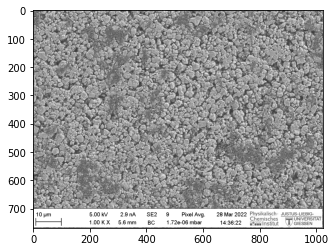

In [3]:
# Checking input image and create results' folders
img = img_as_ubyte(imread((path_original), as_gray=True))
plt.imshow(img, cmap='gray')

directory_res = folder_name + "\\" + "Results_" + file_name 
directory_checks = directory_res + "\\" + "Checks"

try: 
    os.makedirs(directory_res)
except:
    pass

try: 
    os.makedirs(directory_checks)
except:
    pass

In [4]:
def scalebar_detection(img, color_bkg=backgound_clr, color_bar=scalebar_clr, fib='False'):
    
    # Three differen background possible for the HUD
    # SEM-Merlin pics hav a white bkgr
    # FIB-SEM pics have a gray bkgr

    if color_bkg == 'b':
        thres = 0
    elif color_bkg == 'w':
        thres = 255
    elif color_bkg == 'g':
        thres = 96
    
    # Threshold values for the scalebar 
    if color_bar == 'w':
        thres_bar = 200
    elif color_bar == 'b':
        thres_bar = 20
    
    if fib:
        tick_l = 35
    else:
        tick_l = 25

    # Check the mode-color for each line, this detects at wich pixel the HUD is reached
    for line in range(len(img)):
        mode = stats.mode(img[line])
        if line >= 1:
            if int(mode[0]) == thres:
                boundary_h = line
                break
    
    # Separates the HUD from the rest of the image
    ime = img[boundary_h: , : ]

    # Vertical bar detection, for each line the number of contigous pixel
    # of the specified color are counted. This assumes that only the scalebar
    # is characterized by 'long' vertical lines of the given color
    boundary_v = []
    for i in range(1,ime.shape[1]-4):
        if color_bar == 'w':
            for key, group in groupby(ime[:,i]>thres_bar):
                if key:
                    a_list = np.array(list(group))
                    if len(a_list)> tick_l and a_list.all():
                        if (i-1) not in boundary_v:
                            boundary_v.append(i)
                    if len(boundary_v) >= 2:
                        break
        elif color_bar == 'b':
            for key, group in groupby(ime[:,i]<thres_bar):
                if key:
                    a_list = np.array(list(group))
                    if len(a_list)> tick_l and a_list.all():
                        if (i-1) not in boundary_v:
                            boundary_v.append(i)
                    if len(boundary_v) >= 2:
                        break
    return boundary_h, boundary_v

In [5]:
def segm_AM_CBD_pores(original_denoised, original_img, FIB, horizontal_kernel, median_smoothing, ksize_CBD):
    ret, thresh = cv2.threshold(original_denoised,0,255,cv2.THRESH_BINARY+cv2.THRESH_OTSU)
    CBD_pores = (original_denoised < ret)
    if FIB == True:
        AM_i = thresh #(original_denoised >= ret)
        AM_h = cv2.morphologyEx(AM_i,cv2.MORPH_OPEN, horizontal_kernel, iterations=1)
        AM = cv2.medianBlur(AM_h, median_smoothing)
        fig = plt.figure(figsize=(18,6))
        ax1 = fig.add_subplot(1,3,1)
        ax1.imshow(AM_i, cmap="gray")
        ax1.title.set_text("Original AM")
        ax1 = fig.add_subplot(1,3,2)
        ax1.imshow(AM_h, cmap="gray")
        ax1.title.set_text("Filtered AM - removal of vertical lines artefact")
        ax1 = fig.add_subplot(1,3,3)
        ax1.imshow(AM, cmap="gray")
        ax1.title.set_text("Median smootheed AM")
        path_save = directory_checks + "\\" + "Vertical lines artefact removal - AM.png"
        plt.savefig(path_save, dpi=600)
    if FIB == False:
        AM = thresh

    fig = plt.figure(figsize=(18,6))
    ax1 = fig.add_subplot(1,3,1)
    ax1.imshow(original_denoised, cmap="gray")
    ax1.title.set_text("Original_denoised")
    ax1 = fig.add_subplot(1,3,2)
    ax1.imshow(AM, cmap="gray")
    ax1.title.set_text("AM")
    ax1 = fig.add_subplot(1,3,3)
    ax1.imshow(CBD_pores, cmap="gray")
    ax1.title.set_text("CBD + pores")
    path_save = directory_checks + "\\" + "Initial segmentation.png"
    plt.savefig(path_save, dpi=600)
    
    # Getting the CBD phase
    CBD_gray = original_img
    CBD_gray[AM==255] = 0

    equalised_CBD = img_as_ubyte(exposure.equalize_adapthist(CBD_gray, kernel_size = ksize_CBD, clip_limit=0.007))

    fig = plt.figure(figsize=(12,12))
    ax1 = fig.add_subplot(1,3,2)
    ax1.imshow(CBD_gray, cmap="gray")
    ax1.title.set_text("CBD+pores")
    ax1 = fig.add_subplot(1,3,1)
    ax1.imshow(original_denoised, cmap="gray")
    ax1.title.set_text("Original denoised")
    ax1 = fig.add_subplot(1,3,3)
    ax1.imshow(equalised_CBD, cmap="gray")
    ax1.title.set_text("equalised CBD")
    path_save = directory_checks + "\\" + "CBD+pores and original denoised.png"
    plt.savefig(path_save, dpi=600)
    
    # Gaborn filter - https://stackoverflow.com/questions/30071474/opencv-getgaborkernel-parameters-for-filter-bank
    # https://www.pnas.org/doi/pdf/10.1073/pnas.1412616111
    ksize_Gabor = 90
    theta=np.pi/3
    kernel = cv2.getGaborKernel((ksize_Gabor,ksize_Gabor), 1.0, theta, 10.0, 1.9, 0, ktype=cv2.CV_32F)
    filtered_image = cv2.filter2D(CBD_gray,cv2.CV_8UC1, kernel)
    filtered_image[AM==255] = 255
    filtered_image_m = cv2.medianBlur(filtered_image, 3)

    #cv2.imshow("Filtered", filtered_image)
    #cv2.imshow("Filtered+median denoise", filtered_image_m)
    #cv2.imshow("Denoised", NLM_denoised)
    #cv2.waitKey(0)
    #cv2.destroyAllWindows()


    retp, threshp = cv2.threshold(filtered_image,0,255,cv2.THRESH_BINARY+cv2.THRESH_OTSU)
    pore = cv2.medianBlur(threshp, 3)
    #print(retp)
    """
    cv2.imshow("Filtered+median denoise and segmented", pore)
    cv2.imshow("Filtered+median denoise", filtered_image_m)
    cv2.imshow("Denoised", NLM_denoised)
    cv2.waitKey(0)
    cv2.destroyAllWindows()
    """

    img = img_as_ubyte(imread((path_original), as_gray=True))
    original_img = img[:boundary_h-1,:]
    CBD = original_img
    CBD[AM==255] = 0
    CBD[pore==0] = 0
    
    fig = plt.figure(figsize=(12,12))
    ax1 = fig.add_subplot(2,2,1)
    ax1.imshow(original_denoised, cmap="gray")
    ax1.title.set_text("Original denoised")
    ax1 = fig.add_subplot(2,2,2)
    ax1.imshow(CBD, cmap="gray")
    ax1.title.set_text("CBD")
    ax1 = fig.add_subplot(2,2,3)
    ax1.imshow(AM, cmap="gray")
    ax1.title.set_text("AM")
    ax1 = fig.add_subplot(2,2,4)
    ax1.imshow(pore, cmap="gray")
    ax1.title.set_text("Pores")
    path_save = directory_checks + "\\" + "Phases comparison.png"
    plt.savefig(path_save, dpi=600)
    
    s = (len(original_denoised), len(original_denoised[0]),3)
    segmented_image = np.zeros(s)
    segmented_image = img_as_ubyte(segmented_image)
    yi = 0
    for y in original_denoised:
        xi = 0
        for x in y:
            if pore[yi][xi] == 0:
                segmented_image[yi][xi] = [247,247,247]
            if CBD[yi][xi] > 0:
                segmented_image[yi][xi] = [239,138,98]
            if AM[yi][xi] == 255:
                segmented_image[yi][xi] = [98,138,239]
            xi+=1
        yi+=1

    fig = plt.figure(figsize=(20,9))
    ax1 = fig.add_subplot(1,2,1)
    ax1.imshow(original_denoised, cmap="gray")
    ax1.title.set_text("Original denoised")
    ax1 = fig.add_subplot(1,2,2)
    ax1.imshow(segmented_image, cmap="gray")
    ax1.title.set_text("Segmented")

    path_save = directory_res + "\\" + "Final segmentation.png"
    plt.savefig(path_save, dpi=600)

    """
    cv2.imshow("Segmented", segmented_image)
    cv2.imshow("Original denoised", NLM_denoised)
    cv2.waitKey(0)
    cv2.destroyAllWindows()
    """
    
    # Phases distribution
    AM_count = 0
    CBD_count = 0
    pore_count = 0
    for y in segmented_image:
        for x in y:
            if x[0] == 247:
                pore_count+=1
            if x[0] == 239:
                CBD_count += 1
            if x[0] == 98:
                AM_count += 1

    total_pixels = len(segmented_image)*len(segmented_image[0])
    AM_frac = AM_count/total_pixels
    CBD_frac = CBD_count/total_pixels
    pore_frac = pore_count/total_pixels
    assumed_nanoporosity = 0.5
    CBD_without = CBD_frac*assumed_nanoporosity
    pore_with = CBD_frac*assumed_nanoporosity + pore_frac
    total = AM_frac+CBD_frac+pore_frac

    header = ["AM", "CBD", "pore"]
    header2 = ["AM", "CBD without nanopores", "pore with CBD nanopores"]
    fractions = [AM_frac, CBD_frac, pore_frac]
    fractions2 = [AM_frac, CBD_without, pore_with]

    path_phases = directory_res + "\\" + "Phases volume fraction.csv"
    with open(path_phases, 'w') as f: 
        write = csv.writer(f)
        write.writerow(header)
        write.writerow(fractions)
        write.writerow(["Assumed CBD nanoporosity", 0.5, "https://doi.org/10.1002/aenm.201401612"])
        write.writerow(header2)
        write.writerow(fractions2)
    
    return segmented_image, AM, CBD, pore, AM_frac, CBD_frac, pore_frac

In [6]:
def object_recognition(phase, original_denoised, identifier, small_agglomerates, 
                       border, kernel_opening, it_opening,
                       kernel_water, it_opening_sb, thres_factor_dist):
    
    
    if identifier == "pore":
        print("pore")
        s_pore = (len(pore), len(pore[0]))
        pore_rev = np.zeros(s_pore)
        yi=0
        for y in pore:
            xi=0
            for x in y:
                if x == 255:
                    pore_rev[yi][xi] = 0
                if x == 0:
                    pore_rev[yi][xi] = 1
                xi+=1
            yi+=1

        pore_rev = img_as_ubyte(pore_rev)
        phase = pore_rev
        
    if identifier == "CBD":
        print("CBD")
        s_CBD = (len(CBD), len(CBD[0]))
        CBD_binary = np.zeros(s_CBD)

        yi=0
        for y in CBD:
            xi=0
            for x in y:
                if x > 0:
                    CBD_binary[yi][xi] = 1
                xi+=1
            yi+=1

        CBD_binary = img_as_ubyte(CBD_binary)
        phase = CBD_binary
    
    # Cleaning small pixels and removing particles touchng the border
    if small_agglomerates == True:
        phase_opened = cv2.morphologyEx(phase, cv2.MORPH_OPEN, kernel_opening, iterations=it_opening)
    if small_agglomerates == False:
        phase_opened = phase
    if border == False:
        phase_opened_cl = segmentation.clear_border(phase_opened)
    if border == True:
        phase_opened_cl = phase_opened
    
    # Plotting removal small (and) touching borders particles
    fig = plt.figure(figsize=(18,6))
    ax1 = fig.add_subplot(1,3,1)
    ax1.imshow(phase, cmap="gray")
    if identifier == "AM":
        ax1.title.set_text("AM - original")
    if identifier == "pore":
        ax1.title.set_text("Pores - rev")
    if identifier == "CBD":
        ax1.title.set_text("Binary CBD")
    ax1 = fig.add_subplot(1,3,2)
    ax1.imshow(phase_opened, cmap="gray")
    if identifier == "AM":
        ax1.title.set_text("AM - removal very small particles")
    if identifier == "pore":
        ax1.title.set_text("Pores - removal very small pores")
    if identifier == "CBD":
        ax1.title.set_text("CBD - removal very small agglomerates")
    ax1 = fig.add_subplot(1,3,3)
    ax1.imshow(phase_opened_cl, cmap="gray")
    if identifier == "AM":
        ax1.title.set_text("AM - removal very small particles + borders")
        path_save = directory_checks + "\\" + "Very small AM particles and border removal.png"
    if identifier == "pore":
        ax1.title.set_text("Pores - removal very small pores + borders")
        path_save = directory_checks + "\\" + "Very small pores and border removal.png"
    if identifier == "CBD":
        ax1.title.set_text("CBD - removal very small particles")
        path_save = directory_checks + "\\" + "Very small CBD agglomerates removal.png"  
          
    plt.savefig(path_save, dpi=600)
        
   
    # Wateshed procedure

    # Labelling sure backgound, sure foreground, and unknown regions
    sure_bg = cv2.dilate(phase_opened_cl, kernel_water, iterations=it_opening_sb)
    #plt.imshow(sure_bg, cmap="gray")

    dist_transform =cv2.distanceTransform(phase_opened_cl, cv2.DIST_L2,5)
    #plt.imshow(dist_transform, cmap="gray")
    #print(dist_transform.max())
    ret2, sure_fg = cv2.threshold(dist_transform, thres_factor_dist*dist_transform.max(),255,0)
    sure_fg = np.uint8(sure_fg)
    #plt.imshow(sure_fg, cmap="gray")

    unknown = cv2.subtract(sure_bg,sure_fg)

    fig = plt.figure(figsize=(12,12))
    ax1 = fig.add_subplot(2,2,1)
    ax1.imshow(phase_opened_cl, cmap="gray")
    ax1.title.set_text("Original")
    ax1 = fig.add_subplot(2,2,2)
    ax1.imshow(sure_bg, cmap="gray")
    ax1.title.set_text("Sure background")
    ax1 = fig.add_subplot(2,2,3)
    ax1.imshow(sure_fg, cmap="gray")
    ax1.title.set_text("Sure foreground")
    ax1 = fig.add_subplot(2,2,4)
    ax1.imshow(unknown, cmap="gray")
    ax1.title.set_text("Unknown")
    
    # Particles identification 
    ret3, markers = cv2.connectedComponents(sure_fg)
    markers = markers+10 # To give the background a value different from 0 (the 0 should be the unknown regions for watershed)
    markers[unknown==255] = 0 # Make 0s the unknown pixels
    
    img = img_as_ubyte(imread((path_original), as_gray=True))
    original_img = img[:boundary_h-1,:]
    original_rgb = cv2.cvtColor(original_img,cv2.COLOR_GRAY2RGB)
    phase_rgb = cv2.cvtColor(phase,cv2.COLOR_GRAY2RGB)
    #plt.imshow(original_rgb)

    markers = cv2.watershed(original_rgb,markers)

    fig = plt.figure(figsize=(18,9))
    ax1 = fig.add_subplot(1,2,1)
    ax1.imshow(original_denoised, cmap="gray")
    ax1.title.set_text("Original denoised")
    ax1 = fig.add_subplot(1,2,2)
    ax1.imshow(markers)
    ax1.title.set_text("Watershed.png")
    
    
    image_label_overlay_ws = color.label2rgb(markers, image=phase)
    original_rgb[markers == -1] = [255,255,0]
    """
    if identifier == "AM":
        original_rgb[markers == -1] = [98,138,239]
    if identifier == "CBD":
        original_rgb[markers == -1] = [239,138,98]
    if identifier == "pore":
        original_rgb[markers == -1] = [247,247,247]
    """
    

    fig = plt.figure(figsize=(18,6))
    ax1 = fig.add_subplot(1,3,1)
    ax1.imshow(phase, cmap="gray")
    if identifier == "AM":
        ax1.title.set_text("AM - original")
    if identifier == "pore":
        ax1.title.set_text("Pore - original")
    if identifier == "CBD":
        ax1.title.set_text("CBD - original")
    ax1 = fig.add_subplot(1,3,3)
    ax1.imshow(original_rgb, cmap="gray")
    ax1.title.set_text("Original")
    ax1 = fig.add_subplot(1,3,2)
    ax1.imshow(image_label_overlay_ws)
    ax1.title.set_text("Labelled and overlayed image")
    if identifier == "AM":
        path_save = directory_checks + "\\" + "Watershed overlay - AM.png"
    if identifier == "CBD":
        path_save = directory_checks + "\\" + "Watershed overlay - CBD.png"
    if identifier == "pore":
        path_save = directory_checks + "\\" + "Watershed overlay - Pore.png"
        
    plt.savefig(path_save, dpi=600)
    
    plt.clf()
    
    plt.imshow(original_rgb)
    if identifier == "AM":
        path_save = directory_res + "\\" + "Recognized AM particles.png"
    if identifier == "pore":
        path_save = directory_res + "\\" + "Recognized pores.png"
    if identifier == "CBD":
        path_save = directory_res + "\\" + "Recognized CBD agglomerates.png"
    plt.savefig(path_save, dpi=600)

    """
    cv2.imshow("Recognized AM particles", original_rgb)
    cv2.waitKey(0)
    cv2.destroyAllWindows()
    """
    
    return markers

In [7]:
def objects_properties(markers, identifier):
    img = img_as_ubyte(imread((path_original), as_gray=True))
    original_img = img[:boundary_h-1,:]
    
    props = measure.regionprops_table(markers,original_img,
                                      properties=["label",
                                      "area", "equivalent_diameter_area",
                                      "perimeter", "centroid", "solidity", "orientation",
                                       "axis_minor_length", "axis_major_length"])

    properties = pd.DataFrame(props)
    
    properties["Percentage area"] = properties["area"]/sum(properties["area"])
    properties["area_perim"] = 2*properties["area"]/(properties["perimeter"]*(0.5*properties["equivalent_diameter_area"]))
    properties["circulary_Wadell"] = (properties["equivalent_diameter_area"]*np.pi) / properties["perimeter"]
    # file:///C:/Users/teolo/Downloads/minerals-09-00768.pdf - 
    #Wadell, H.A. Sphericity and roundness of rock particles. J. Geol. 1933, 41, 310–331. - 
    #Wadell, H.A. Volume, shape and roundness of rock particles. J. Geol. 1932, 40, 443–451.
    properties["aspect ratio"] = properties["axis_major_length"]/properties["axis_minor_length"]
    properties["equivalent_diameter_um"] = properties["equivalent_diameter_area"]*pixel_lenght/1000

    properties = properties.iloc[1: , :]
    
    if identifier == "AM":
        path_save = directory_res + "\\" + "AM_particles_properties.csv"
    if identifier == "CBD":
        path_save = directory_res + "\\" + "CBD_agglomerates_properties.csv"
    if identifier == "pore":
        path_save = directory_res + "\\" + "Pores_properties.csv"
    
    properties.to_csv(path_save, index=False)
    
    colous = properties["equivalent_diameter_um"]**2/max(properties["equivalent_diameter_um"]**2)
    size = colous*250
    
    if identifier == "AM":
        col_hist = "royalblue"
        col_p = plt.cm.cool(colous)
    if identifier == "CBD":
        col_hist = "darkorange"
        colours = []
        for i in properties["equivalent_diameter_um"]:
            value = max(0.3, i**2/max(properties["equivalent_diameter_um"]**2))
            colours.append(value)
        col_p = plt.cm.Wistia(colours)
    if identifier == "pore":
        col_hist = "gray"
        colours = []
        for i in properties["equivalent_diameter_um"]:
            value = max(0.2, i**2/max(properties["equivalent_diameter_um"]**2))
            colours.append(value)
        col_p = plt.cm.binary(colours)
    
    fig_, ax_ = plt.subplots(ncols=2, nrows=1, figsize=(14, 6))
    sns.histplot(properties["equivalent_diameter_um"], bins=20, ax=ax_[0], color=col_hist)
    ax_[0].set_xlabel("Equivalent diameter (µm)", fontsize=16)
    ax_[0].set_ylabel("Counts", fontsize=16)
    sns.histplot(properties["aspect ratio"], bins=20, ax=ax_[1], color=col_hist)
    ax_[1].set_xlabel("Aspect ratio", fontsize=16)
    ax_[1].set_ylabel("Counts", fontsize=16)
    
    if identifier == "AM":
        path_save = directory_res + "\\" + "AMs PSD and aspect ratio.png"
    if identifier == "CBD":
        path_save = directory_res + "\\" + "CBDs PSD and aspect ratio.png"
    if identifier == "pore":
        path_save = directory_res + "\\" + "Pores size distribution and aspect ratio.png"
        
    plt.savefig(path_save, dpi=600)
    
    fig_, ax_ = plt.subplots(ncols=2, nrows=2, figsize=(16, 12))

    sns.histplot(properties["circulary_Wadell"], bins=20, ax=ax_[1,0], color=col_hist, binrange=(0,1))
    ax_[1,0].set_xlabel("Wadell circularity", fontsize=16)
    ax_[1,0].set_ylabel("Counts", fontsize=16)
    #ax_[1,0].set_xlim([0,1])
    ax_[1,1].scatter(properties["equivalent_diameter_um"], properties["circulary_Wadell"], s=size, c=col_p)
    ax_[1,1].set_ylim([0,1.05])
    ax_[1,1].set_xlabel("Equivalent diameter (µm)", fontsize=16)
    ax_[1,1].set_ylabel("Wadell circularity", fontsize=16)
    ax_[1,1] = fig.add_subplot(2,2,2)

    sns.histplot(properties["solidity"], bins=20, ax=ax_[0,0], color=col_hist)
    ax_[0,0].set_xlabel("Solidity", fontsize=16)
    ax_[0,0].set_ylabel("Counts", fontsize=16)
    ax_[0,1].scatter(properties["equivalent_diameter_um"], properties["solidity"], s=size, c=col_p)
    ax_[0,1].set_ylim([0,1.05])
    ax_[0,1].set_xlabel("Equivalent diameter (µm)", fontsize=16)
    ax_[0,1].set_ylabel("Solidity", fontsize=16)
    ax_[0,1] = fig.add_subplot(2,2,4)
    
    if identifier == "AM":
        path_save = directory_res + "\\" + "AMs sphericity and regularity.png"
    if identifier == "CBD":
        path_save = directory_res + "\\" + "CBDs sphericity and regularity.png"
    if identifier == "pore":
        path_save = directory_res + "\\" + "Pores sphericity and regularity.png"
    
    plt.savefig(path_save, dpi=600)
    
    return properties

In [8]:
def interfaces(segmented_image):
    AM_CBD_count = 0
    AM_pore_count = 0
    CBD_pore_count = 0

    yc = 0
    for y in segmented_image:
        xc = 0
        for x in y:
            if segmented_image[yc][xc][0] == 98:
                try:
                    if segmented_image[yc][xc+1][0] == 239:
                        AM_CBD_count+=1
                    if segmented_image[yc+1][xc][0] == 239:
                        AM_CBD_count+=1
                    if segmented_image[yc][xc+1][0] == 247:
                        AM_pore_count+=1
                    if segmented_image[yc+1][xc][0] == 247:
                        AM_pore_count+=1
                except:
                    continue
            if segmented_image[yc][xc][0] == 239:
                try:
                    if segmented_image[yc][xc+1][0] == 247:
                        CBD_pore_count+=1
                    if segmented_image[yc+1][xc][0] == 247:
                        CBD_pore_count+=1
                except:
                    continue
            xc+=1
        yc+=1

    AM_CBD_int_um = AM_CBD_count*pixel_lenght/1000
    AM_pore_int_um = AM_pore_count*pixel_lenght/1000
    CBD_pore_int_um = CBD_pore_count*pixel_lenght/1000

    AM_CBD_int_perc = AM_CBD_count/(AM_CBD_count+AM_pore_count)
    AM_pore_int_perc = AM_pore_count/(AM_CBD_count+AM_pore_count)
    CBD_pore_int_perc = CBD_pore_count/(CBD_pore_count+AM_CBD_count)
    CBD_AM_int_perc = AM_CBD_count/(CBD_pore_count+AM_CBD_count)


    header = ["AM-CBD interface (um)", "AM-pore interface (um)", "CBD-pore interface (um)"]
    header2 = ["AM-CBD interface (%)", "AM-pore interface (%)", "CBD-AM  interface (%)", "CBD-pore interface (%)"]
    int_umn = [AM_CBD_int_um,AM_pore_int_um,CBD_pore_int_um]
    int_perc = [AM_CBD_int_perc,AM_pore_int_perc,CBD_pore_int_perc, CBD_AM_int_perc]

    path_phases = directory_res + "\\" + "Interfaces.csv"
    with open(path_phases, 'w') as f: 
        write = csv.writer(f)
        write.writerow(header)
        write.writerow(int_umn)
        write.writerow(header2)
        write.writerow(int_perc)

    #print(AM_CBD_int_um,AM_pore_int_um,CBD_pore_int_um)
    #print(AM_CBD_int_perc,AM_pore_int_perc,CBD_pore_int_perc, CBD_AM_int_perc)
    return AM_CBD_int_um,AM_pore_int_um,CBD_pore_int_um, AM_CBD_int_perc,AM_pore_int_perc,CBD_pore_int_perc, CBD_AM_int_perc

Pixel resolution (nm/pixel) 111.11111111111111


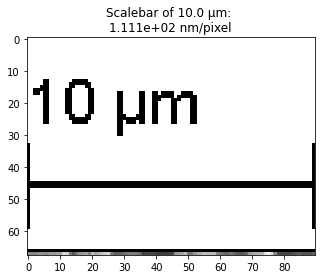

In [9]:
# Scalebar detection and pixel resolution determination
boundary_h, boundary_v = scalebar_detection(img, color_bkg=backgound_clr, color_bar=scalebar_clr, fib=False)
ime = img[boundary_h: , (boundary_v[0]+1):(boundary_v[1]+1)]

# Calculates the pixel lengh in nm
pixel_lenght = 1000*scalebar_lenght/(boundary_v[1]-boundary_v[0])

# Plotting Jargon
plt.imshow(ime, cmap='gray')
plt.title('Scalebar of {} µm: \n{:.3e} nm/pixel'.format(scalebar_lenght, pixel_lenght ))
print("Pixel resolution (nm/pixel)", pixel_lenght)

# Output calculated pixel resolution
path_res =  directory_checks + '\\' + "Pixel_resolution.txt"
res_print = open(path_res, 'w')
res_print.write("Pixel resolution(nm/pixel): " + str(pixel_lenght))
res_print.close()

C:\Users\teolo\AppData\Local\Temp\ipykernel_2700\3161443491.py:4: FutureWarning: `multichannel` is a deprecated argument name for `denoise_nl_means`. It will be removed in version 1.0. Please use `channel_axis` instead.
  NLM_denoised = denoise_nl_means(original_img, h=0.04, fast_mode=True, patch_size=5, patch_distance=6, multichannel=False, preserve_range=False)


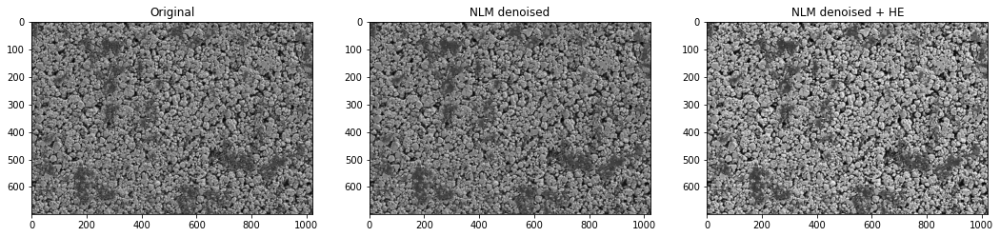

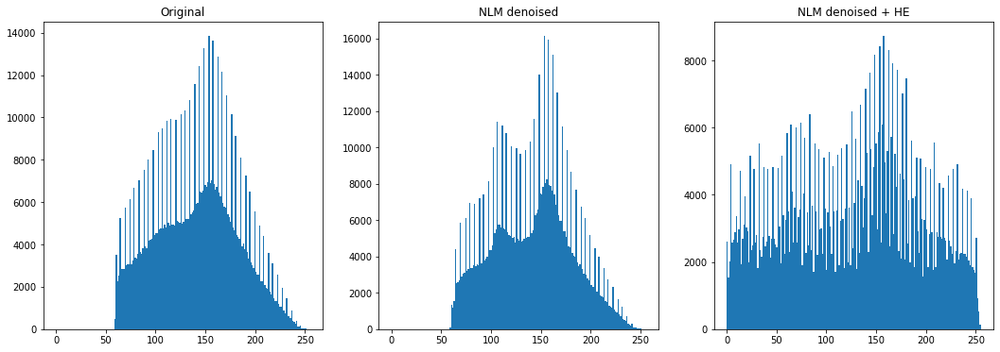

In [10]:
# Denoising of the original image
original_img = img[:boundary_h-1,:]
#plt.imshow(original_img, cmap="gray")
NLM_denoised = denoise_nl_means(original_img, h=0.04, fast_mode=True, patch_size=5, patch_distance=6, multichannel=False, preserve_range=False)
NLM_denoised = img_as_ubyte(NLM_denoised)
equalised_img = img_as_ubyte(exposure.equalize_adapthist(NLM_denoised, kernel_size = 600, clip_limit=0.007))
equalised_img = img_as_ubyte(equalised_img)

fig = plt.figure(figsize=(18,6))
ax1 = fig.add_subplot(1,3,1)
ax1.imshow(original_img, cmap="gray")
ax1.title.set_text("Original")
ax1 = fig.add_subplot(1,3,2)
ax1.imshow(NLM_denoised, cmap="gray")
ax1.title.set_text("NLM denoised")
ax1 = fig.add_subplot(1,3,3)
ax1.imshow(equalised_img, cmap="gray")
ax1.title.set_text("NLM denoised + HE")
path_save = directory_checks + "\\" + "Denoise comparison.png"
plt.savefig(path_save, dpi=600)

# Checking histograms
fig = plt.figure(figsize=(18,6))
ax1 = fig.add_subplot(1,3,1)
ax1.hist(original_img.flat, bins=200, range=(0,255))
ax1.title.set_text("Original")
ax1 = fig.add_subplot(1,3,2)
ax1.hist(NLM_denoised.flat, bins=200, range=(0,255))
ax1.title.set_text("NLM denoised")
ax1 = fig.add_subplot(1,3,3)
ax1.hist(equalised_img.flat, bins=200, range=(0,255))
ax1.title.set_text("NLM denoised + HE")
path_save = directory_checks + "\\" + "Denoise comparison - histograms.png"
plt.savefig(path_save, dpi=600)

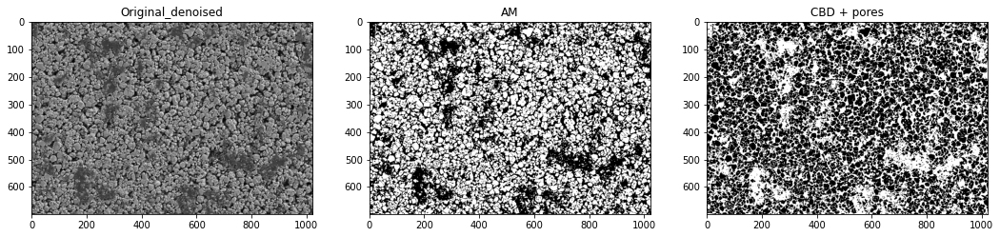

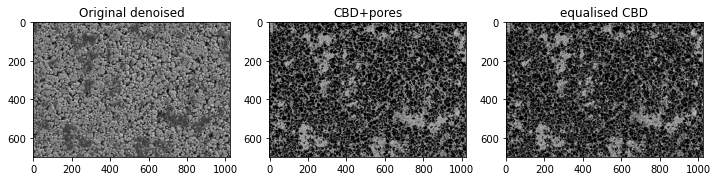

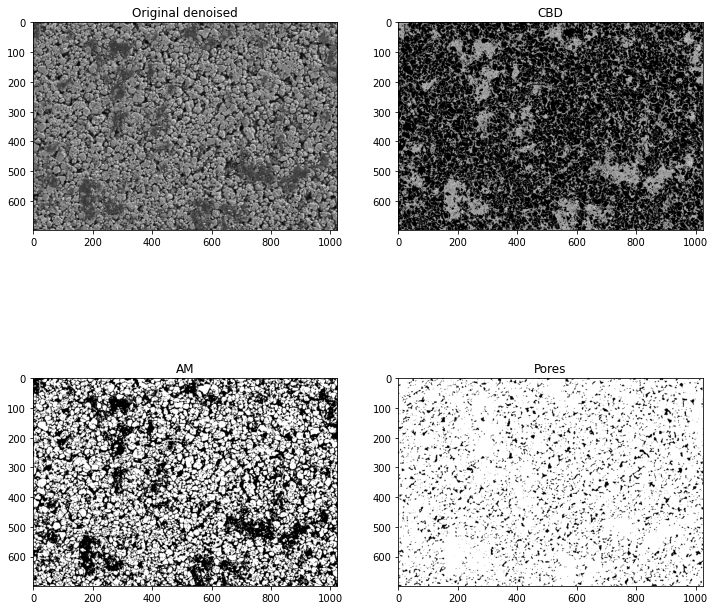

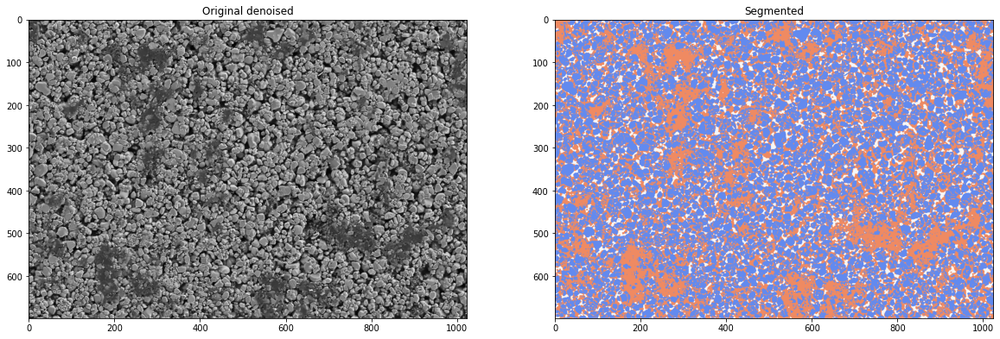

In [11]:
# Segmenting image in AM, CBD, and pore phases
k_size_CBD = 600
FIB = False
horizontal_kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (10,1)) # Used only if FIB = True
median_smoothing = 5 # Used only if FIB = True
segmented_image, AM, CBD, pore, AM_frac, CBD_frac, pore_frac = segm_AM_CBD_pores(NLM_denoised, original_img, FIB, horizontal_kernel, median_smoothing, k_size_CBD)

In [12]:
AM_CBD_int_um,AM_pore_int_um,CBD_pore_int_um, AM_CBD_int_perc,AM_pore_int_perc,CBD_pore_int_perc, CBD_AM_int_perc = interfaces(segmented_image)

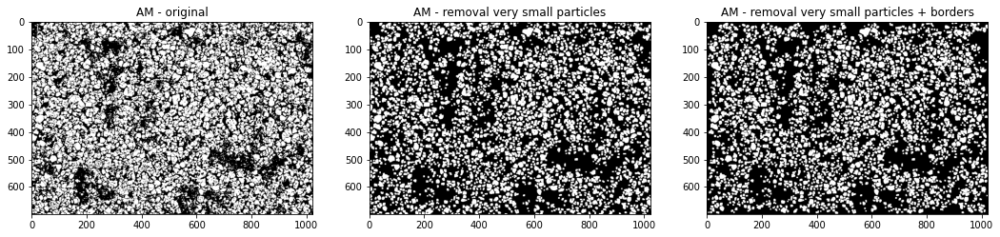

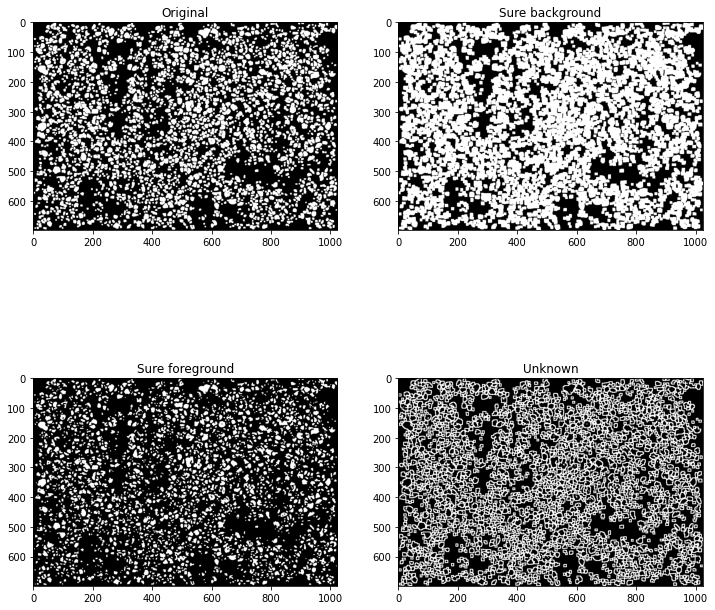

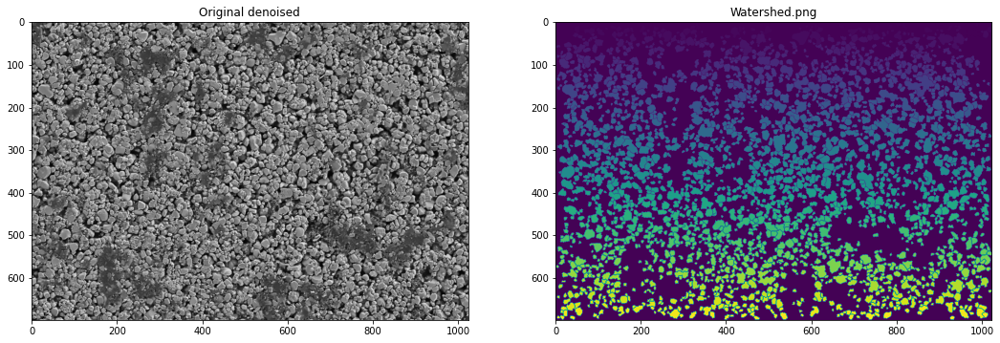

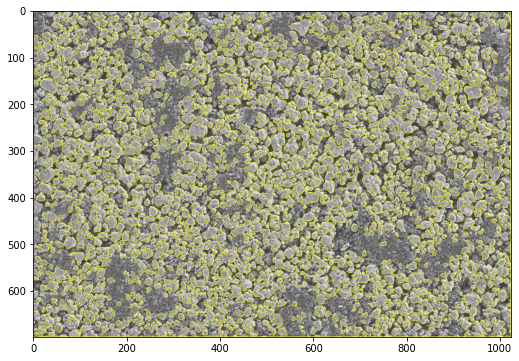

In [13]:
# Particles/pores identification
#AM phase
kernel_opening = np.ones((kernel_opening_AM, kernel_opening_AM), np.uint8) # Used only if small_agglomerates==True
kernel_water = np.ones((kernel_water_AM, kernel_water_AM), np.uint8) # Used to define the sure background
markers_AM = object_recognition(AM, NLM_denoised, "AM", small_agglomerates_AM, 
                                border_AM, kernel_opening, it_opening_AM, 
                                kernel_water, it_opening_sb_AM, thres_factor_dist_AM)

CBD


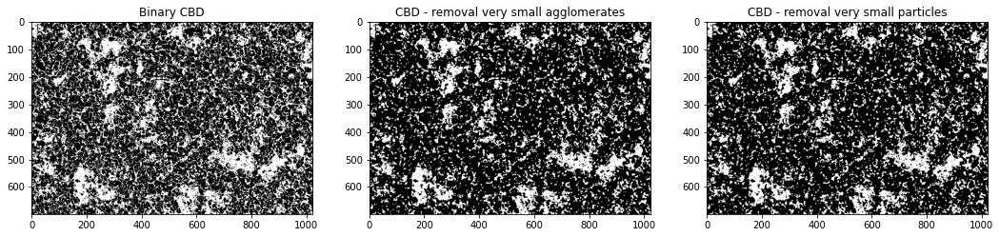

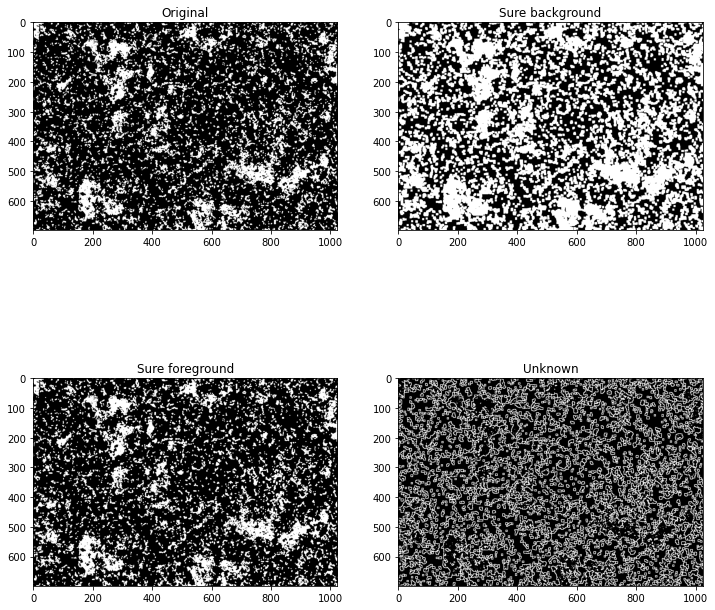

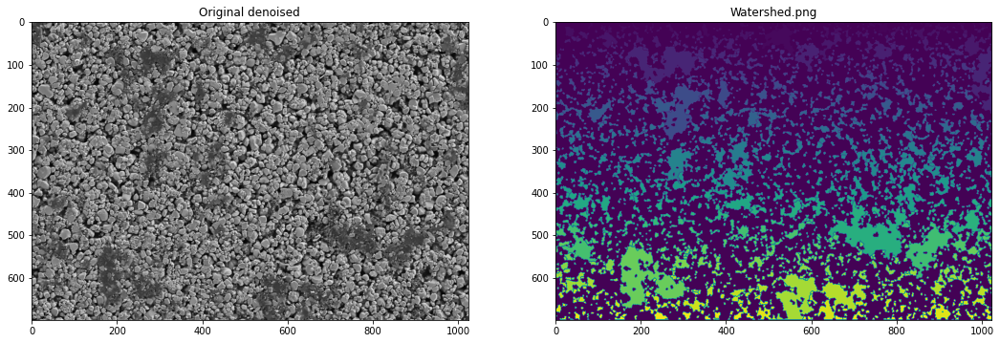

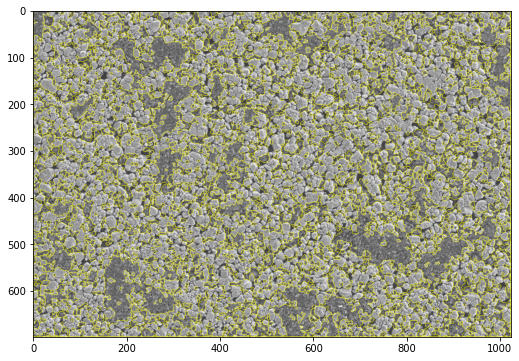

In [14]:
# CBD phase
kernel_opening = np.ones((kernel_opening_CBD,kernel_opening_CBD), np.uint8)
kernel_water = np.ones((kernel_water_CBD,kernel_water_CBD), np.uint8)
markers_CBD = object_recognition(CBD, NLM_denoised, "CBD", small_agglomerates_CBD, 
                                 border_CBD, kernel_opening, it_opening_CBD, 
                                 kernel_water, it_opening_sb_CBD, thres_factor_dist_CBD)

pore


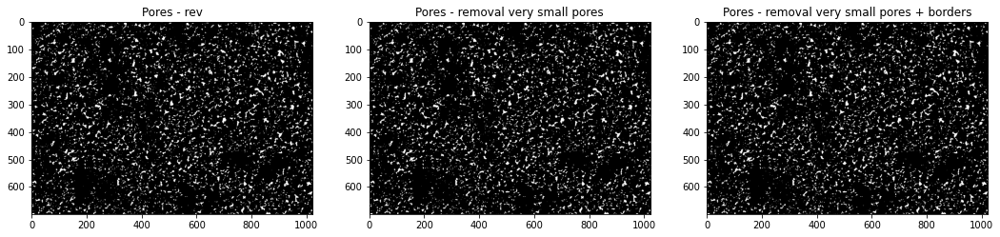

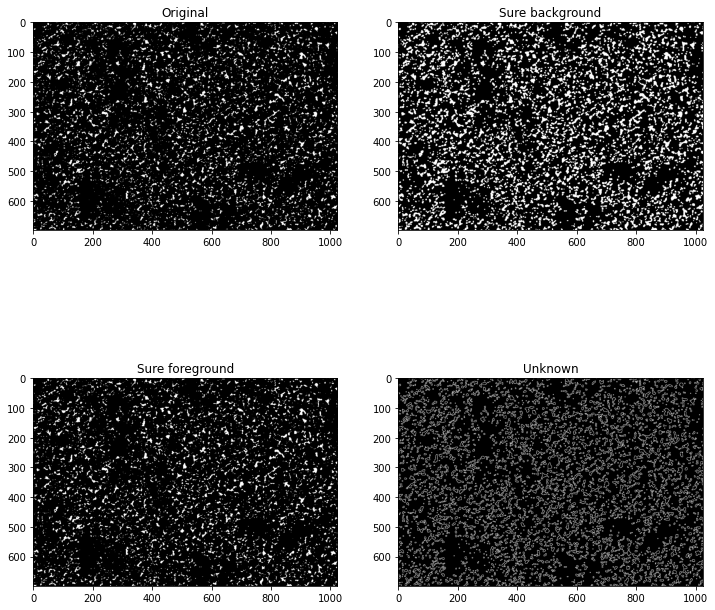

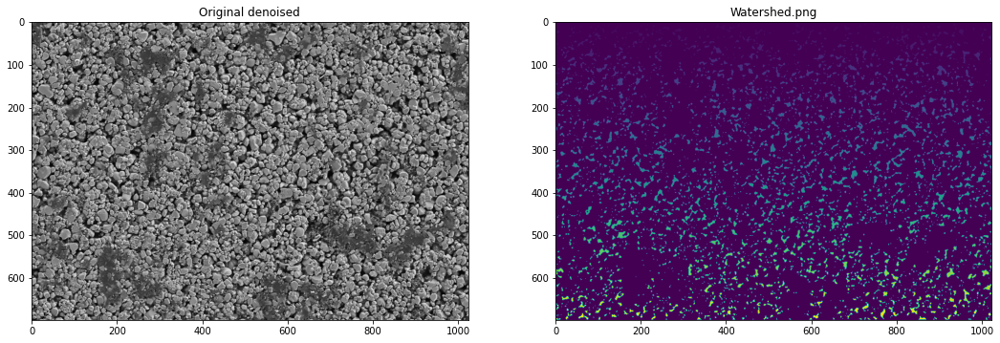

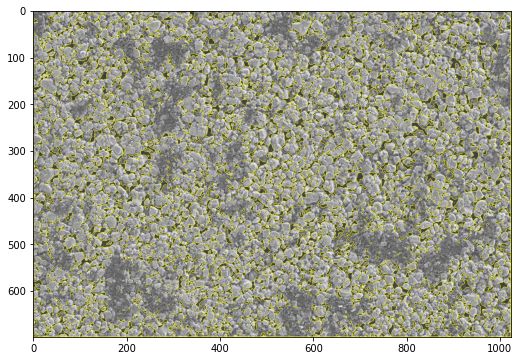

In [15]:
# Pore phase
kernel_opening = np.ones((kernel_opening_pore,kernel_opening_pore), np.uint8)
kernel_water = np.ones((kernel_water_pore,kernel_water_pore), np.uint8)
markers_pore = object_recognition(pore, NLM_denoised, "pore", small_agglomerates_pore,
                                  border_pore, kernel_opening, it_opening_pore, 
                                  kernel_water, it_opening_sb_pore, thres_factor_dist_pore)

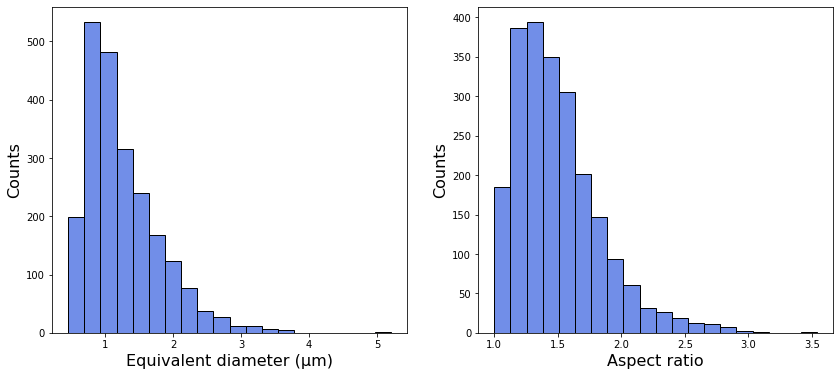

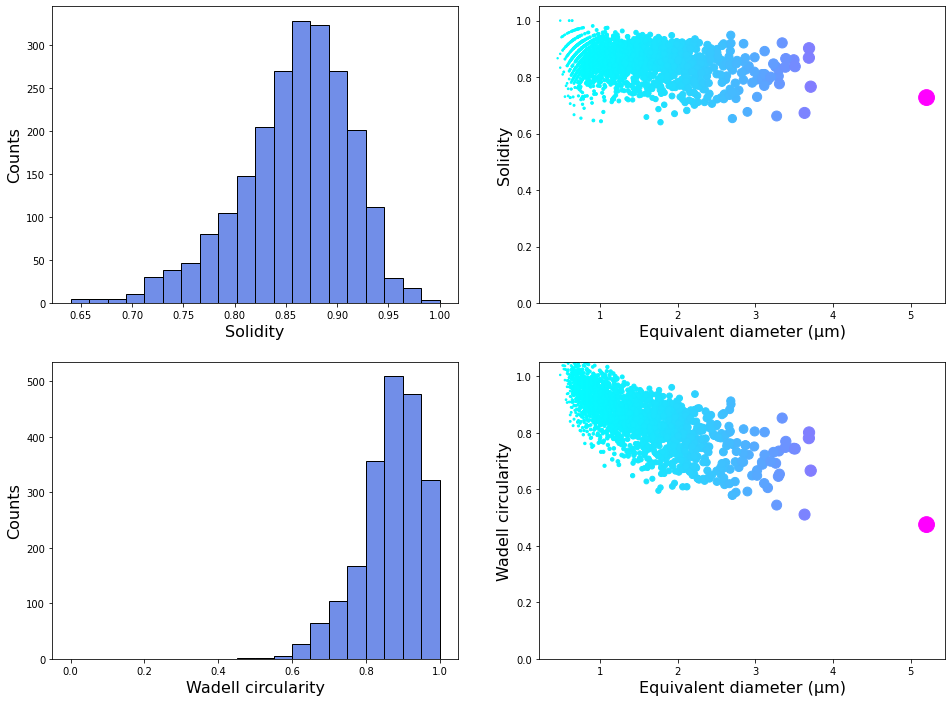

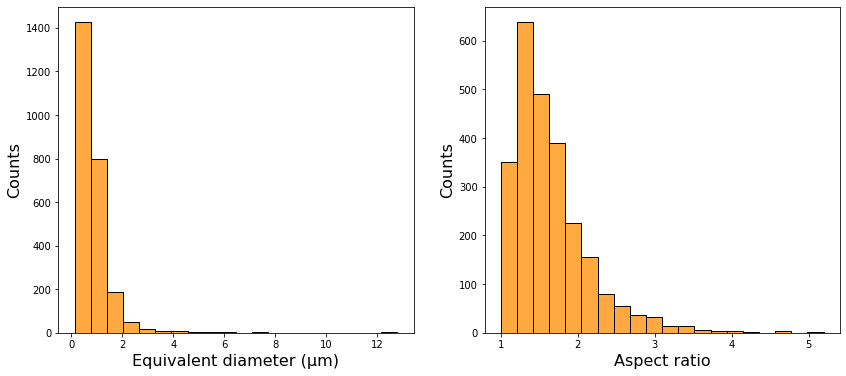

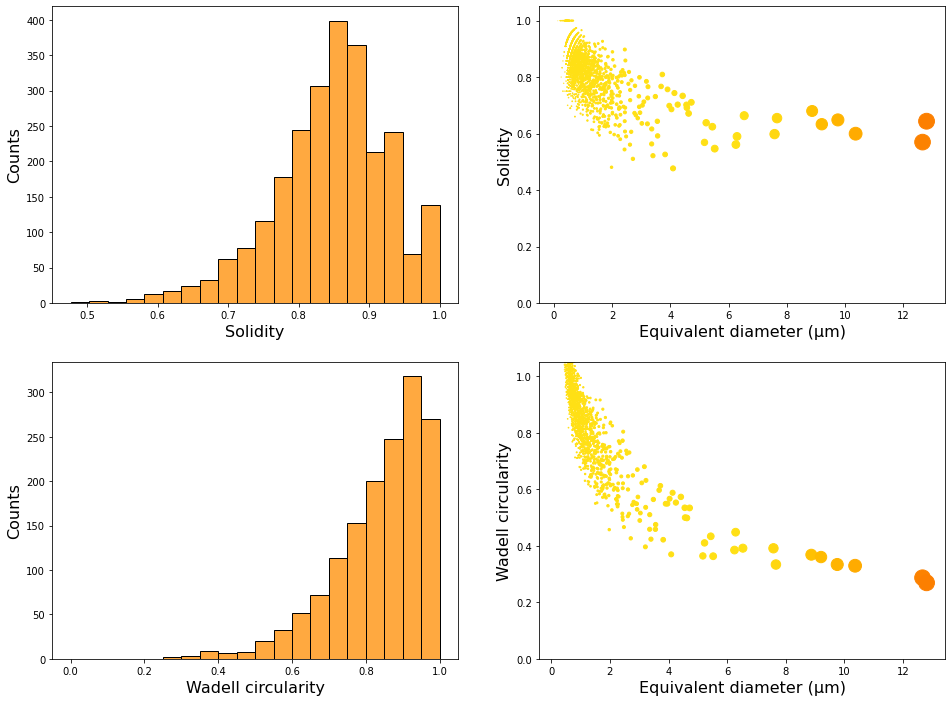

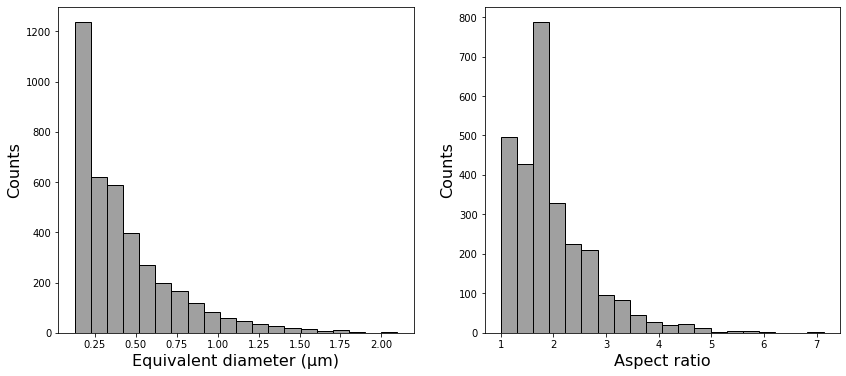

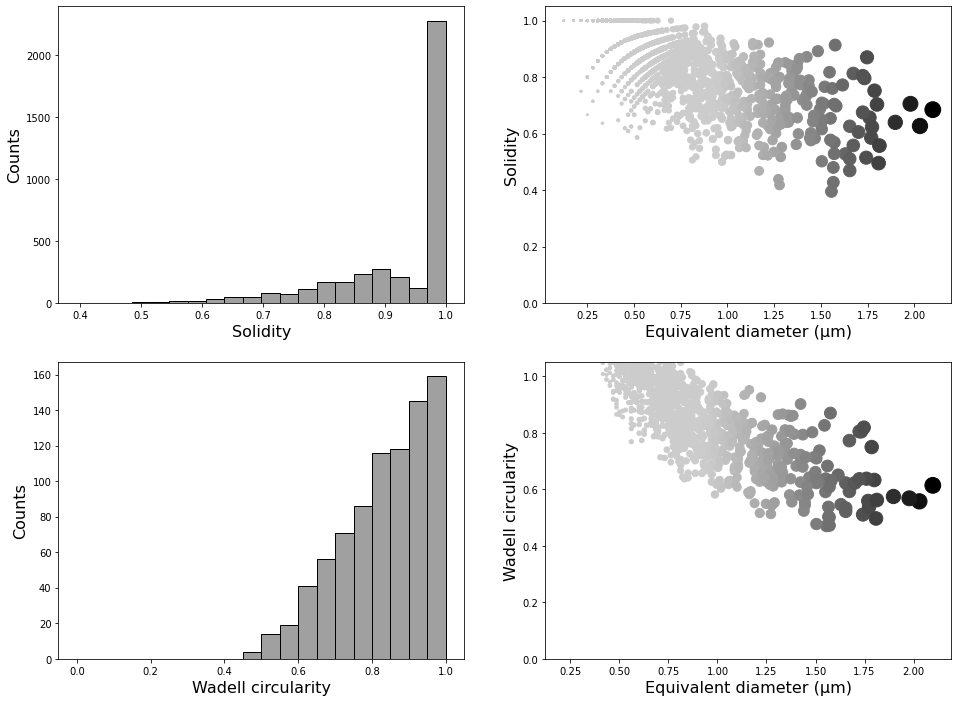

In [17]:
# Calculate AM, CBD, and pore properties
properties_AM = objects_properties(markers_AM, "AM")
properties_CBD = objects_properties(markers_CBD, "CBD")
properties_pore = objects_properties(markers_pore, "pore")